In [138]:
import pandas as pd
from ydata_profiling import ProfileReport
from ast import literal_eval
import re
from sklearn.preprocessing import StandardScaler

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

In [139]:
train = pd.read_csv('data/train.csv')
data_dictionary = pd.read_csv('data/data_dictionary.csv')

# Function to enforce data types and check for bad values
def enforce_data_types_and_check(train, data_dictionary):
    bad_values = {}
    for _, row in data_dictionary.iterrows():
        col_name = row['variable']
        col_type = row['type']

        if col_name == "efs":
            continue
        if col_type == 'Numerical':
            train[col_name] = pd.to_numeric(train[col_name], errors='coerce')
            #bad_values[col_name] = train[train[col_name].isnull() & train[col_name].notna()][col_name].unique()
        elif col_type == 'Categorical':
            # Extract items inside single quotes
            pattern = r"'([^']*)'|nan"
            categories = re.findall(pattern, row['values'])
            
            train[col_name] = pd.Categorical(train[col_name], categories=categories)
            bad_values[col_name] = train[(~train[col_name].isin(categories)) & (~train[col_name].isnull())][col_name].unique()
    
    # Filter out columns with no bad values
    bad_values = {k: v for k, v in bad_values.items() if len(v) > 0}
    return bad_values

enforce_data_types_and_check(train, data_dictionary)

{}

In [106]:
data_dictionary[data_dictionary['variable'].str.contains('efs')]

,variable,description,type,values
57,efs,Event-free survival,Categorical,['Event' 'Censoring']
58,efs_time,"Time to event-free survival, months",Numerical,NaN


# Profiling

In [4]:
# Generate a comprehensive profile report
profile = ProfileReport(train, title="Training Data Profiling Report", explorative=True)

In [6]:
profile.to_notebook_iframe()

Render HTML: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


# Creating features

In [ ]:
# Select the columns to be scaled
columns_to_scale = ['hla_match_c_high', 'hla_high_res_8', 'hla_low_res_6', 'hla_high_res_6',
                    'hla_high_res_10', 'hla_match_dqb1_high', 'hla_nmdp_6',
                    'hla_match_c_low', 'hla_match_drb1_low', 'hla_match_dqb1_low',
                    'hla_match_a_high', 'hla_match_b_low', 'hla_match_a_low',
                    'hla_match_b_high', 'hla_low_res_8', 'hla_match_drb1_high',
                    'hla_low_res_10']

# Initialize the StandardScaler
scaler = StandardScaler()

# Fit and transform the selected columns
scaled_column = pd.DataFrame(scaler.fit_transform(train[columns_to_scale]), columns=columns_to_scale, index=train.index)

train['mean_hla_matching'] = scaled_column.mean(axis=1)

# Filter all HLA-related columns
non_hla_columns = [col for col in train.columns if 'hla' not in col.lower() or col == "mean_hla_matching"]
train = train[non_hla_columns]

In [108]:
scaled_column.notnull().any(axis=1).value_counts()

True     27451
False     1349
Name: count, dtype: int64

<Axes: xlabel='mean_hla_matching', ylabel='Count'>

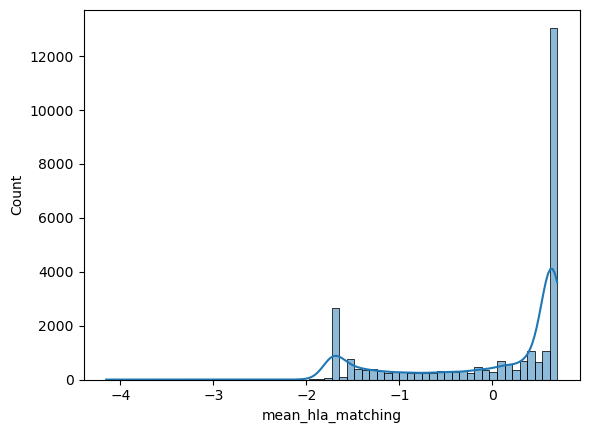

In [109]:
sns.histplot(train['mean_hla_matching'], kde=True)  # Add KDE line for better visualization

In [ ]:
# Convert the columns into boolean
boolean_columns = ['diabetes', 'arrhythmia', 'vent_hist', 'renal_issue', 'pulm_severe', 'rituximab',
                   'in_vivo_tcd', 'hepatic_severe', 'prior_tumor', 'peptic_ulcer', 'rheum_issue',
                   'cardiac', 'pulm_moderate', 'obesity', 'hepatic_mild', 'psych_disturb']

for col in boolean_columns:
    train[col] = train[col].apply(lambda x: True if x == "Yes" else (False if x == "No" else np.nan)).astype('boolean')


In [110]:
# Convert sex_match into a boolean
train['sex_match_bool'] = train['sex_match'].apply(lambda x: True if x in ['M-M', 'F-F'] else False)
train['cmv_status_bool'] = train['cmv_status'].apply(lambda x: True if x in ['+/+', '-/-'] else False)
train['tce_imm_match_bool'] = train['tce_imm_match'].apply(lambda x: True if x in ['P/P', 'G/G', 'H/H'] else False)
train['donor_related_bool'] = train['donor_related'].apply(lambda x: True if x == 'Related' else False)

# Assign values to tce_match categories (higher = better match)
tce_match_values = {
    'Fully matched': 4,        # Best match
    'Permissive': 3,           # Good match
    'HvG non-permissive': 2,   # Medium risk - host might reject graft
    'GvH non-permissive': 1    # Highest risk - graft might attack host
}

# Assign values to tce_div_match categories (higher = better match)
tce_div_match_values = {
    'Permissive mismatched': 4,          # Best case for mismatches
    'HvG non-permissive': 3,             # Medium risk - host might reject
    'GvH non-permissive': 2,             # Higher risk - graft might attack host
    'Bi-directional non-permissive': 1   # Highest risk - problems both ways
}

# Create new columns with numerical values
train['tce_match_value'] = train['tce_match'].map(tce_match_values)
train['tce_div_match_value'] = train['tce_div_match'].map(tce_div_match_values)

train.drop(columns=['sex_match', 'cmv_status', 'tce_imm_match', 'donor_related', 'tce_match', 'tce_div_match'], inplace=True)

In [113]:
# Non-resident of the U.S. - who cares? it's not relevant to the analysis
train['is_hispanic'] = train['ethnicity'].apply(lambda x: True if x == 'Hispanic or Latino' else (False if x == "Not Hispanic or Latino" else np.nan))
train.drop(columns = ['ethnicity'], inplace = True)

train['mrd_hct'] = train['mrd_hct'].apply(lambda x: True if x == "Positive" else (False if x == "Negative" else np.nan)).astype('boolean')
train['melphalan_dose'] = train['melphalan_dose'].apply(lambda x: True if x == "MEL" else (False if x == "N/A, Mel not given" else np.nan)).astype('boolean')

# one liner to map conditioning_intensity: /Users/talshor/Projects/kaggle_1o1/your_script.py
train['conditioning_intensity'] = train['conditioning_intensity'].map({'NMA': 0, 'RIC': 1, 'MAC': 2})
train['cyto_score_detail'] = train['cyto_score_detail'].map({'Favorable': 2, 'Intermediate': 1, 'Poor': 0})

train['prod_type_is_pb'] = train['prod_type'].apply(lambda x: True if x == "PB" else (False if x == "BM" else np.nan)).astype('boolean')
train['graft_type_is_pb'] = train['graft_type'].apply(lambda x: True if x == "Peripheral blood" else (False if x == "Bone marrow" else np.nan)).astype('boolean')
train.drop(columns=['prod_type', 'graft_type'], inplace = True)

train['cyto_score'] = train['cyto_score'].map({'Poor': 0, 'Intermediate': 1, 'Normal': 2, 'Favorable':3, 'TBD': np.nan, 'Other': np.nan, 'Not tested': np.nan})
train['dri_score'] = train['dri_score'].map({
    'Low': 0,
    'Intermediate': 1,
    'High': 2,
    'Very high': 3,
    'Intermediate - TED AML case <missing cytogenetics': 1,
    'High - TED AML case <missing cytogenetics': 2,
    'TBD cytogenetics': np.nan,
    'N/A - pediatric': np.nan,
    'N/A - non-malignant indication': np.nan,
    'N/A - disease not classifiable': np.nan,
    'Missing disease status': np.nan
})


hotones_columns = ['race_group', 'conditioning_intensity', 'gvhd_proph', 'prim_disease_hct', 'tbi_status']
for col in hotones_columns:
    train = pd.concat([train, pd.get_dummies(train[col], dummy_na=np.nan, prefix=col)], axis=1)
    train.drop(columns=[col], inplace = True)

In [ ]:
people_we_dont_know_the_results = ((train['efs'] == 0) & (train['efs_time'] < 5))
train = train[~people_we_dont_know_the_results]

In [122]:
train.to_parquet('data/train_cleaned_v1.parquet')

In [101]:
(train == "Yes").sum(axis=0).sort_values()

ID                                          0
prim_disease_hct_ALL                        0
gvhd_proph_nan                              0
gvhd_proph_CSA +- others(not FK,MMF,MTX)    0
gvhd_proph_CDselect +- other                0
                                           ..
efs                                         0
pulm_moderate                               0
cardiac                                     0
conditioning_intensity_1.0                  0
tbi_status_nan                              0
Length: 97, dtype: Int64

# V2

In [144]:
train = pd.read_csv('data/train.csv')
data_dictionary = pd.read_csv('data/data_dictionary.csv')

# Function to enforce data types and check for bad values
def enforce_data_types_and_check(train, data_dictionary):
    bad_values = {}
    for _, row in data_dictionary.iterrows():
        col_name = row['variable']
        col_type = row['type']

        if col_name == "efs":
            continue
        if col_type == 'Numerical':
            train[col_name] = pd.to_numeric(train[col_name], errors='coerce')
            #bad_values[col_name] = train[train[col_name].isnull() & train[col_name].notna()][col_name].unique()
        elif col_type == 'Categorical':
            # Extract items inside single quotes
            pattern = r"'([^']*)'|nan"
            categories = re.findall(pattern, row['values'])
            
            train[col_name] = pd.Categorical(train[col_name], categories=categories)
            bad_values[col_name] = train[(~train[col_name].isin(categories)) & (~train[col_name].isnull())][col_name].unique()
    
    # Filter out columns with no bad values
    bad_values = {k: v for k, v in bad_values.items() if len(v) > 0}
    return bad_values

enforce_data_types_and_check(train, data_dictionary)

{}

In [145]:
# Convert the columns into boolean
boolean_columns = ['diabetes', 'arrhythmia', 'vent_hist', 'renal_issue', 'pulm_severe', 'rituximab',
                   'in_vivo_tcd', 'hepatic_severe', 'prior_tumor', 'peptic_ulcer', 'rheum_issue',
                   'cardiac', 'pulm_moderate', 'obesity', 'hepatic_mild', 'psych_disturb']

for col in boolean_columns:
    train[col] = train[col].apply(lambda x: True if x == "Yes" else (False if x == "No" else np.nan)).astype('boolean')


In [146]:


train['mrd_hct'] = train['mrd_hct'].apply(lambda x: True if x == "Positive" else (False if x == "Negative" else np.nan)).astype('boolean')
train['melphalan_dose'] = train['melphalan_dose'].apply(lambda x: True if x == "MEL" else (False if x == "N/A, Mel not given" else np.nan)).astype('boolean')

# one liner to map conditioning_intensity: /Users/talshor/Projects/kaggle_1o1/your_script.py
#train['conditioning_intensity'] = train['conditioning_intensity'].map({'NMA': 0, 'RIC': 1, 'MAC': 2})
train['cyto_score_detail'] = train['cyto_score_detail'].map({'Favorable': 2, 'Intermediate': 1, 'Poor': 0})

train['prod_type_is_pb'] = train['prod_type'].apply(lambda x: True if x == "PB" else (False if x == "BM" else np.nan)).astype('boolean')
train['graft_type_is_pb'] = train['graft_type'].apply(lambda x: True if x == "Peripheral blood" else (False if x == "Bone marrow" else np.nan)).astype('boolean')
train.drop(columns=['prod_type', 'graft_type'], inplace = True)

train['cyto_score'] = train['cyto_score'].map({'Poor': 0, 'Intermediate': 1, 'Normal': 2, 'Favorable':3, 'TBD': np.nan, 'Other': np.nan, 'Not tested': np.nan})

hotones_columns = ['race_group', 'conditioning_intensity', 'gvhd_proph', 'prim_disease_hct', 'tbi_status', 'dri_score', 'tce_match', 'tce_div_match', 'cmv_status', 'tce_imm_match', 'sex_match', 'donor_related', 'ethnicity']
for col in hotones_columns:
    train = pd.concat([train, pd.get_dummies(train[col], dummy_na=np.nan, prefix=col)], axis=1)
    train.drop(columns=[col], inplace = True)


people_we_dont_know_the_results = ((train['efs'] == 0) & (train['efs_time'] < 5))
train = train[~people_we_dont_know_the_results]


train.to_parquet('data/train_cleaned_v2.parquet')

In [10]:
from sklearn.impute import SimpleImputer
from fancyimpute import KNN

data = train[[
    'mean_hla_matching', 'sex_match_bool', 'cmv_status_bool', 
    'tce_imm_match_bool', 'donor_related_bool', 'tce_match_value', 'tce_div_match_value']]

# Initialize the StandardScaler
donor_scaler = StandardScaler()

# Fit and transform the selected columns
# Use a simple imputation strategy for each column

# Create an imputer that uses the mean strategy
# Create a KNN imputer which tends to perform better than simple mean imputation
imputer = KNN(k=5)  # Use 5 nearest neighbors for imputation

# First impute the missing values, then scale the data while preserving the index
data_imputed = pd.DataFrame(imputer.fit_transform(data), columns=data.columns, index=data.index)
data_scaled = pd.DataFrame(donor_scaler.fit_transform(data_imputed), columns=data.columns, index=data.index)


/Users/talshor/miniconda3/envs/kaggle/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/talshor/miniconda3/envs/kaggle/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/talshor/miniconda3/envs/kaggle/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Imputing row 1/28800 with 3 missing, elapsed time: 54.860
Imputing row 101/28800 with 1 missing, elapsed time: 54.883
Imputing row 201/28800 with 0 missing, elapsed time: 54.898
Imputing row 301/28800 with 0 missing, elapsed time: 54.914
Imputing row 401/28800 with 3 missing, elapsed time: 54.927
Imputing row 501/28800 with 3 missing, elapsed time: 54.945
Imputing row 601/28800 with 3 missing, elapsed time: 54.962
Imputing row 701/28800 with 1 missing, elapsed time: 54.977
Imputing row 801/28800 with 1 missing, elapsed time: 54.993
Imputing row 901/28800 with 3 missing, elapsed time: 55.011
Imputing row 1001/28800 with 3 missing, elapsed time: 55.026
Imputing row 1101/28800 with 0 missing, elapsed time: 55.044
Imputing row 1201/28800 with 1 missing, elapsed time: 55.056
Imputing row 1301/28800 with 0 missing, elapsed time: 55.084
Imputing row 1401/28800 with 0 missing, elapsed time: 55.108
Imputing row 1501/28800 with 1 missing, elapsed time: 55.137
Imputing row 1601/28800 with 2 missi

In [ ]:
x = train.groupby('efs').apply(lambda df: df.assign(efs_rank = lambda x: x['efs_time'].rank()))
# Group by 'efs' and rank within each group
x = train.groupby('efs').apply(lambda df: df.assign(efs_rank=df['efs_time'].rank()))

# Negate the ranks for the events group (efs=1) so lower ranks mean earlier events
# This makes events (1) have negative values and censored (0) have positive values
mask = x.index.get_level_values(0) == 1
x.loc[mask, 'efs_rank'] = x.loc[mask, 'efs_rank'] - x.loc[mask, 'efs_rank'].max()

/var/folders/_n/k7yj8dgj6ps_bq2j3zpk07vc0000gn/T/ipykernel_16386/975534298.py:1: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  x = train.groupby('efs').apply(lambda df: df.assign(efs_rank = lambda x: x['efs_time'].rank()))
/var/folders/_n/k7yj8dgj6ps_bq2j3zpk07vc0000gn/T/ipykernel_16386/975534298.py:3: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  x = train.groupby('efs').apply(lambda df: df.assign(efs_rank

<Axes: xlabel='efs_time', ylabel='efs_rank'>

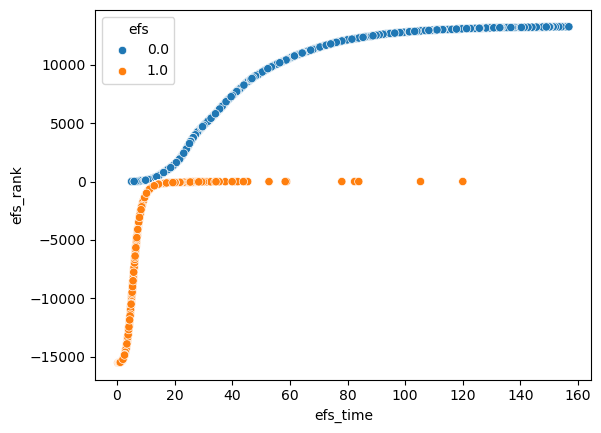

In [176]:
sns.scatterplot(data=x, x='efs_time', y='efs_rank', hue='efs')

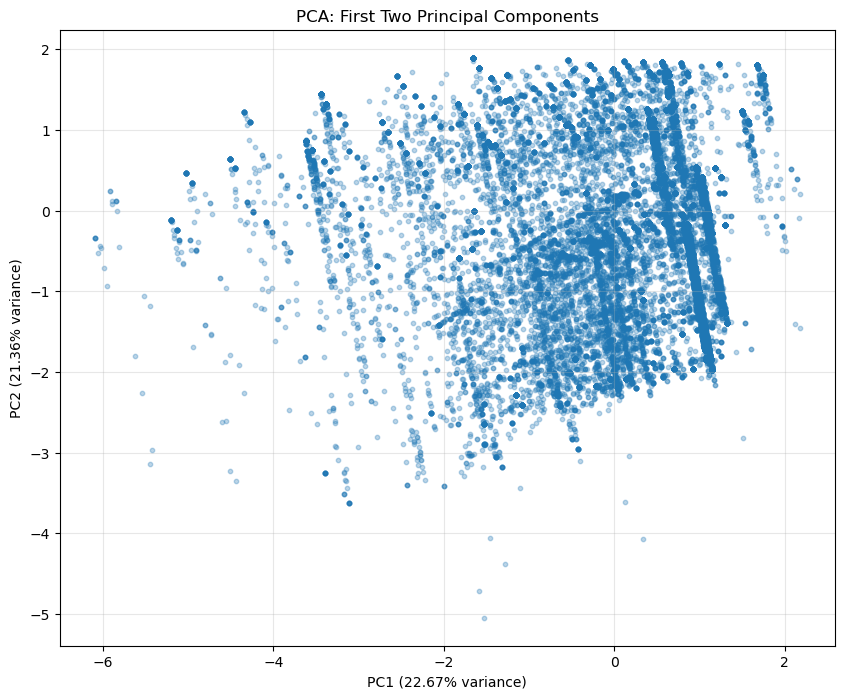

Explained variance ratio:
[0.22672294 0.21357389 0.14419533 0.14296277 0.12076412 0.0808762
 0.07090475]
Total variance explained: 100.00%


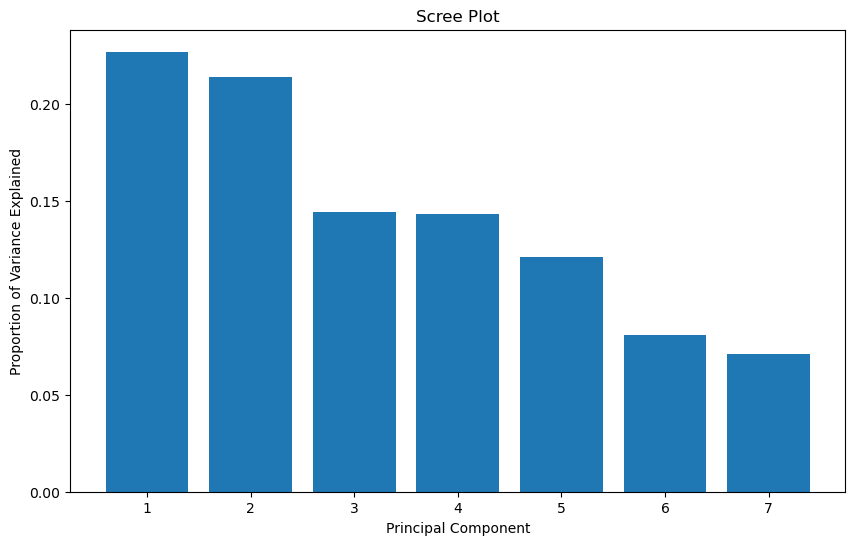


PCA Loadings (Feature Importance for each Principal Component):
                          PC1       PC2       PC3       PC4       PC5  \
mean_hla_matching   -0.105826  0.654711 -0.047806  0.003598 -0.346633   
sex_match_bool      -0.034239  0.060809  0.916385 -0.329474  0.188470   
cmv_status_bool     -0.084595 -0.280395  0.368123  0.723010 -0.489056   
tce_imm_match_bool   0.355969  0.221603  0.053317  0.568624  0.659260   
donor_related_bool   0.198018 -0.642672 -0.105731 -0.160973  0.082954   
tce_match_value      0.625150 -0.016327  0.091685 -0.121922 -0.384132   
tce_div_match_value  0.650948  0.163194  0.003225 -0.067678 -0.126836   

                          PC6       PC7  
mean_hla_matching    0.538680 -0.384090  
sex_match_bool       0.101333 -0.032030  
cmv_status_bool      0.097863  0.084920  
tce_imm_match_bool   0.049795 -0.246778  
donor_related_bool   0.624326 -0.337647  
tce_match_value     -0.444958 -0.490004  
tce_div_match_value  0.315797  0.655155  


/var/folders/_n/k7yj8dgj6ps_bq2j3zpk07vc0000gn/T/ipykernel_11970/893389874.py:68: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


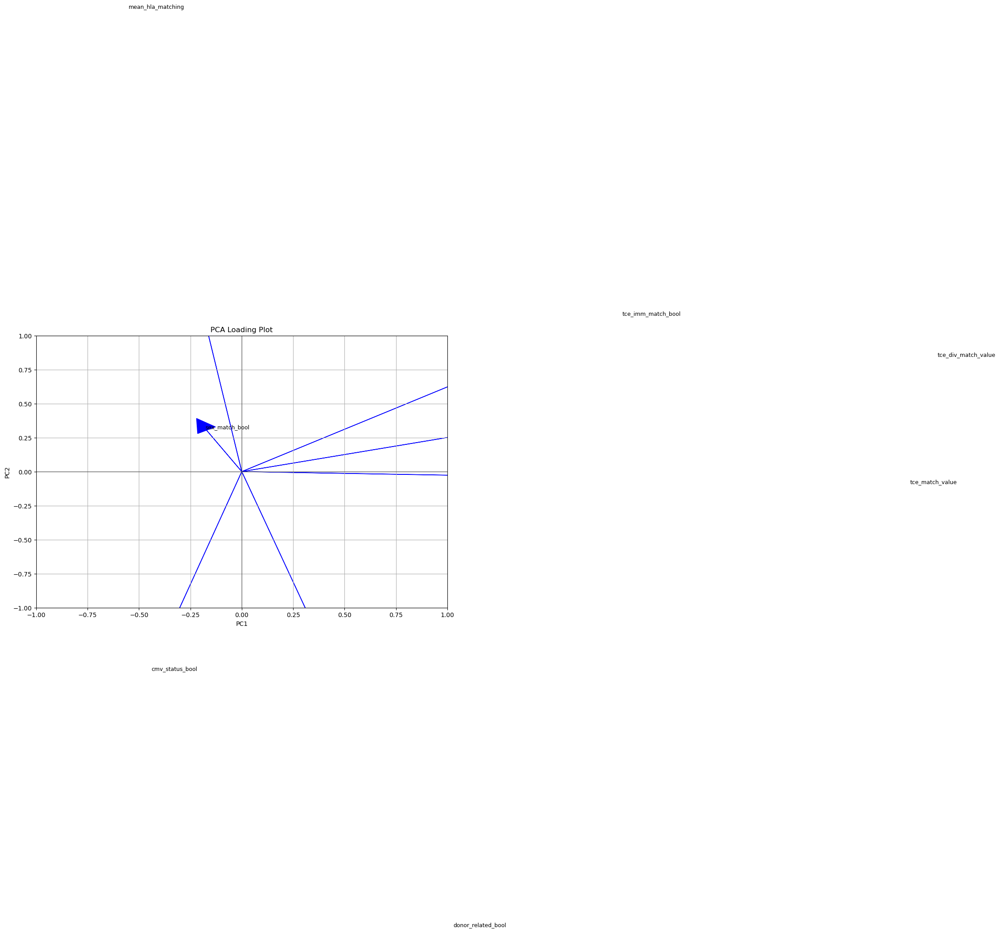

In [11]:
from sklearn.decomposition import PCA

import matplotlib.pyplot as plt

# Fill NaN values with 0 to ensure PCA works properly
data_for_pca = data_scaled# .fillna(0)

# Create PCA model with 7 components (or less if you want to reduce dimensions)
# First, let's visualize the data in 2D to check for patterns
pca_2d = PCA(n_components=2)
principal_components_2d = pca_2d.fit_transform(data_for_pca)

# Create a scatter plot for the first two principal components
plt.figure(figsize=(10, 8))
plt.scatter(principal_components_2d[:, 0], principal_components_2d[:, 1], 
            alpha=0.3, s=10)
plt.title('PCA: First Two Principal Components')
plt.xlabel(f'PC1 ({pca_2d.explained_variance_ratio_[0]:.2%} variance)')
plt.ylabel(f'PC2 ({pca_2d.explained_variance_ratio_[1]:.2%} variance)')
plt.grid(True, alpha=0.3)
plt.show()
pca = PCA(n_components=7)
principal_components = pca.fit_transform(data_for_pca)

# Create a DataFrame for the principal components
pc_df = pd.DataFrame(data=principal_components, 
                     columns=[f'PC{i+1}' for i in range(pca.n_components_)])

# Show explained variance ratio
print("Explained variance ratio:")
print(pca.explained_variance_ratio_)
print(f"Total variance explained: {sum(pca.explained_variance_ratio_)*100:.2f}%")

# Plot variance explained by each component
plt.figure(figsize=(10, 6))
plt.bar(range(1, len(pca.explained_variance_ratio_) + 1), pca.explained_variance_ratio_)
plt.xlabel('Principal Component')
plt.ylabel('Proportion of Variance Explained')
plt.title('Scree Plot')
plt.xticks(range(1, len(pca.explained_variance_ratio_) + 1))
plt.show()

# Display the loadings (feature importance for each principal component)
loadings = pd.DataFrame(
    pca.components_.T,
    columns=[f'PC{i+1}' for i in range(pca.n_components_)],
    index=data_scaled.columns
)

print("\nPCA Loadings (Feature Importance for each Principal Component):")
print(loadings)

# Visualize the loadings for the first two principal components
plt.figure(figsize=(12, 8))
for i, feature in enumerate(data_scaled.columns):
    plt.arrow(0, 0, loadings.iloc[i, 0] * 5, loadings.iloc[i, 1] * 5, 
              head_width=0.1, head_length=0.1, fc='blue', ec='blue')
    plt.text(loadings.iloc[i, 0] * 5.2, loadings.iloc[i, 1] * 5.2, feature, fontsize=9)

plt.xlim(-1, 1)
plt.ylim(-1, 1)
plt.grid(True)
plt.axhline(y=0, color='k', linestyle='-', alpha=0.3)
plt.axvline(x=0, color='k', linestyle='-', alpha=0.3)
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('PCA Loading Plot')
plt.tight_layout()
plt.show()

In [14]:
train[['efs', 'efs_time']].dropna()

,efs,efs_time


<Axes: xlabel='efs_time', ylabel='Count'>

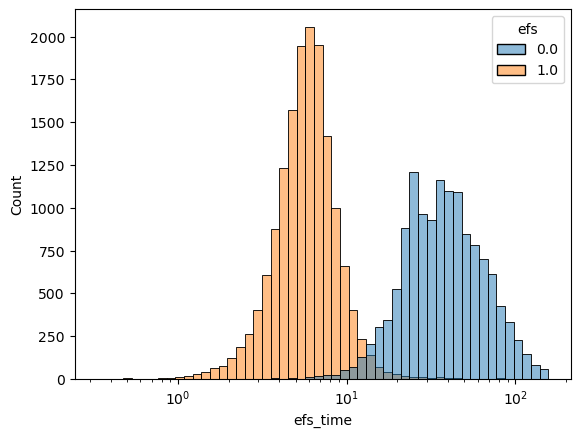

In [115]:
sns.histplot(train, x='efs_time', hue='efs', log_scale=True)

In [ ]:
people_we_dont_know_the_results = ((train['efs'] == 0) & (train['efs_time'] < 20)).sum()

1484